In [ ]:
import numpy as np

import drnb.embed.pipeline as pl
from drnb.experiment import Experiment

# Annealing neighbors

See [part 1](umap-annealed-neighbors-01.ipynb) for an introduction and default UMAP results and 
[part 2](umap-annealed-neighbors-02-tumap.ipynb) for a comparison with t-UMAP with spectral
initialization.

## Part 3: PCA initialization

Another difference between PaCMAP and UMAP is the type of initialization: PaCMAP uses PCA and UMAP
uses spectral initialization (something close to Laplacian Eigenmaps). Both methods use randomized
approaches to truncated SVD which implies the possibility of an effect of the random seed on the
approximation. If I had to guess I would say that PCA gives less variable output because the
spectral initialization puts a lot of emphasis on reproducing neighbors without repulsion so
although the layout may be amenable to clustering it is visually unappealing and leads to long 
"arms" of points extending from a very compact core. Although you can see this kind of structure in
PCA it's not as pronounced.

But I don't need to guess, as we can initialize UMAP from PCA as well as spectral methods. We will
use the `a=1, b=1` t-UMAP paramters as we did in part 2.

In [ ]:
experiment = Experiment(name="tumap-annealed-neighbors-pca")

seeds = np.random.SeedSequence(42).generate_state(5)

for i, seed in enumerate(seeds, 1):
    experiment.add_method(
        [
            pl.embedder(
                "umap",
                params={
                    "random_state": seed,
                    "n_neighbors": 150,
                    "a": 1,
                    "b": 1,
                    "init": "pca",
                },
            ),
            pl.embedder(
                "umap", params={"random_state": seed, "n_neighbors": 50, "a": 1, "b": 1}
            ),
            pl.embedder(
                "umap", params={"random_state": seed, "n_neighbors": 15, "a": 1, "b": 1}
            ),
        ],
        name=f"tumap-run-{i}",
    )

experiment.add_datasets(
    [
        "curve2d",
        "mammoth",
        "scurvehole",
        "isoswiss",
        "hierarchical",
        "spheres",
        "coil20",
        "coil100",
        "mnist",
        "fashion",
        "ng20pacmap",
        "macosko2015",
        "tasic2018",
        "lamanno2020",
        "kazer",
        "stuart",
        "kang",
    ]
)
experiment.run()

[22:29:31] INFO     Running tumap-run-1 on curve2d                                  ]8;id=112774;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=605053;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:29:35] INFO     Running tumap-run-1 on mammoth                                  ]8;id=689729;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=607004;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:30:50] INFO     Running tumap-run-1 on scurvehole                               ]8;id=43574;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=155410;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:31:19] INFO     Running tumap-run-1 on isoswiss                                 ]8;id=343616;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=51560;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:31:44] INFO     Running tumap-run-1 on hierarchical                             ]8;id=220545;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=989111;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:33:35] INFO     Running tumap-run-1 on spheres                                  ]8;id=926718;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=410081;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:34:13] INFO     Running tumap-run-1 on coil20                                   ]8;id=650734;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=62200;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:34:20] INFO     Running tumap-run-1 on coil100                                  ]8;id=927280;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=113538;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:35:12] INFO     Running tumap-run-1 on mnist                                    ]8;id=162670;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=475654;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:37:12] INFO     Running tumap-run-1 on fashion                                  ]8;id=943072;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=396315;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:39:18] INFO     Running tumap-run-1 on ng20pacmap                               ]8;id=922259;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=214153;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:39:48] INFO     Running tumap-run-1 on macosko2015                              ]8;id=374518;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=995510;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:41:23] INFO     Running tumap-run-1 on tasic2018                                ]8;id=682754;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=872584;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:42:07] INFO     Running tumap-run-1 on lamanno2020                              ]8;id=762630;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=200774;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:42:22] INFO     Running tumap-run-1 on kazer                                    ]8;id=991675;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=508763;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:44:08] INFO     Running tumap-run-1 on stuart                                   ]8;id=252996;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=913417;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:45:03] INFO     Running tumap-run-1 on kang                                     ]8;id=486404;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=397071;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:45:26] INFO     Running tumap-run-2 on curve2d                                  ]8;id=510156;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=322605;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:45:30] INFO     Running tumap-run-2 on mammoth                                  ]8;id=600893;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=596888;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:46:44] INFO     Running tumap-run-2 on scurvehole                               ]8;id=309674;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=11792;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:47:12] INFO     Running tumap-run-2 on isoswiss                                 ]8;id=454643;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=501500;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:47:38] INFO     Running tumap-run-2 on hierarchical                             ]8;id=677561;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=540116;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:49:26] INFO     Running tumap-run-2 on spheres                                  ]8;id=712548;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=882344;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:50:03] INFO     Running tumap-run-2 on coil20                                   ]8;id=341883;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=503445;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:50:10] INFO     Running tumap-run-2 on coil100                                  ]8;id=355330;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=182477;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:51:02] INFO     Running tumap-run-2 on mnist                                    ]8;id=236927;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=921;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:53:01] INFO     Running tumap-run-2 on fashion                                  ]8;id=256501;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=366529;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:55:05] INFO     Running tumap-run-2 on ng20pacmap                               ]8;id=959026;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=873105;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:55:35] INFO     Running tumap-run-2 on macosko2015                              ]8;id=523680;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=897220;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:57:05] INFO     Running tumap-run-2 on tasic2018                                ]8;id=392610;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=455069;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:57:49] INFO     Running tumap-run-2 on lamanno2020                              ]8;id=8318;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=884138;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:58:04] INFO     Running tumap-run-2 on kazer                                    ]8;id=838096;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=560967;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[22:59:47] INFO     Running tumap-run-2 on stuart                                   ]8;id=722811;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=439805;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:00:40] INFO     Running tumap-run-2 on kang                                     ]8;id=267724;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=385119;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:01:03] INFO     Running tumap-run-3 on curve2d                                  ]8;id=566111;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=116609;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:01:07] INFO     Running tumap-run-3 on mammoth                                  ]8;id=585901;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=967867;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:02:18] INFO     Running tumap-run-3 on scurvehole                               ]8;id=684838;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=847590;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:02:46] INFO     Running tumap-run-3 on isoswiss                                 ]8;id=884101;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=522230;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:03:11] INFO     Running tumap-run-3 on hierarchical                             ]8;id=481812;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=567731;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:04:58] INFO     Running tumap-run-3 on spheres                                  ]8;id=242014;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=952452;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:05:35] INFO     Running tumap-run-3 on coil20                                   ]8;id=670564;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=168755;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:05:43] INFO     Running tumap-run-3 on coil100                                  ]8;id=449629;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=741508;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:06:37] INFO     Running tumap-run-3 on mnist                                    ]8;id=34613;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=529823;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:08:53] INFO     Running tumap-run-3 on fashion                                  ]8;id=384963;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=673807;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:11:05] INFO     Running tumap-run-3 on ng20pacmap                               ]8;id=676236;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=613566;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:11:35] INFO     Running tumap-run-3 on macosko2015                              ]8;id=245983;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=984068;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:13:05] INFO     Running tumap-run-3 on tasic2018                                ]8;id=195812;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=543087;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:13:49] INFO     Running tumap-run-3 on lamanno2020                              ]8;id=219602;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=433409;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:14:03] INFO     Running tumap-run-3 on kazer                                    ]8;id=285151;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=942869;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:15:54] INFO     Running tumap-run-3 on stuart                                   ]8;id=456337;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=815826;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:16:48] INFO     Running tumap-run-3 on kang                                     ]8;id=487712;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=151797;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:17:10] INFO     Running tumap-run-4 on curve2d                                  ]8;id=165503;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=273720;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:17:15] INFO     Running tumap-run-4 on mammoth                                  ]8;id=956367;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=504431;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:18:27] INFO     Running tumap-run-4 on scurvehole                               ]8;id=231906;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=460233;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:18:55] INFO     Running tumap-run-4 on isoswiss                                 ]8;id=524962;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=319139;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:19:20] INFO     Running tumap-run-4 on hierarchical                             ]8;id=492260;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=258146;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:21:07] INFO     Running tumap-run-4 on spheres                                  ]8;id=122875;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=814065;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:21:44] INFO     Running tumap-run-4 on coil20                                   ]8;id=432723;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=289689;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:21:51] INFO     Running tumap-run-4 on coil100                                  ]8;id=138380;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=145114;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:22:43] INFO     Running tumap-run-4 on mnist                                    ]8;id=45236;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=810448;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:24:44] INFO     Running tumap-run-4 on fashion                                  ]8;id=698414;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=710136;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:26:52] INFO     Running tumap-run-4 on ng20pacmap                               ]8;id=109202;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=930328;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:27:22] INFO     Running tumap-run-4 on macosko2015                              ]8;id=877983;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=884312;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:28:54] INFO     Running tumap-run-4 on tasic2018                                ]8;id=902400;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=514568;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:29:38] INFO     Running tumap-run-4 on lamanno2020                              ]8;id=837002;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=675846;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:29:53] INFO     Running tumap-run-4 on kazer                                    ]8;id=631115;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=143973;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:31:38] INFO     Running tumap-run-4 on stuart                                   ]8;id=243051;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=997040;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:32:32] INFO     Running tumap-run-4 on kang                                     ]8;id=105441;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=254373;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:32:54] INFO     Running tumap-run-5 on curve2d                                  ]8;id=971194;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=582820;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:32:58] INFO     Running tumap-run-5 on mammoth                                  ]8;id=951515;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=913286;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:34:10] INFO     Running tumap-run-5 on scurvehole                               ]8;id=359606;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=459598;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:34:38] INFO     Running tumap-run-5 on isoswiss                                 ]8;id=162448;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=562678;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:35:04] INFO     Running tumap-run-5 on hierarchical                             ]8;id=363904;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=751330;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:36:59] INFO     Running tumap-run-5 on spheres                                  ]8;id=463675;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=57543;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:37:36] INFO     Running tumap-run-5 on coil20                                   ]8;id=34420;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=724581;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:37:43] INFO     Running tumap-run-5 on coil100                                  ]8;id=227127;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=41510;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:38:34] INFO     Running tumap-run-5 on mnist                                    ]8;id=838720;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=238805;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:40:38] INFO     Running tumap-run-5 on fashion                                  ]8;id=639045;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=427632;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:42:43] INFO     Running tumap-run-5 on ng20pacmap                               ]8;id=727653;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=898410;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:43:13] INFO     Running tumap-run-5 on macosko2015                              ]8;id=773695;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=570287;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:44:54] INFO     Running tumap-run-5 on tasic2018                                ]8;id=851687;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=486429;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:45:37] INFO     Running tumap-run-5 on lamanno2020                              ]8;id=604598;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=561019;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:45:52] INFO     Running tumap-run-5 on kazer                                    ]8;id=251440;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=555025;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:47:36] INFO     Running tumap-run-5 on stuart                                   ]8;id=896724;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=647741;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

[23:48:29] INFO     Running tumap-run-5 on kang                                     ]8;id=73459;file:///home/james/dev/drnb3/src/drnb/experiment.py\experiment.py]8;;\:]8;id=830388;file:///home/james/dev/drnb3/src/drnb/experiment.py#67\67]8;;\

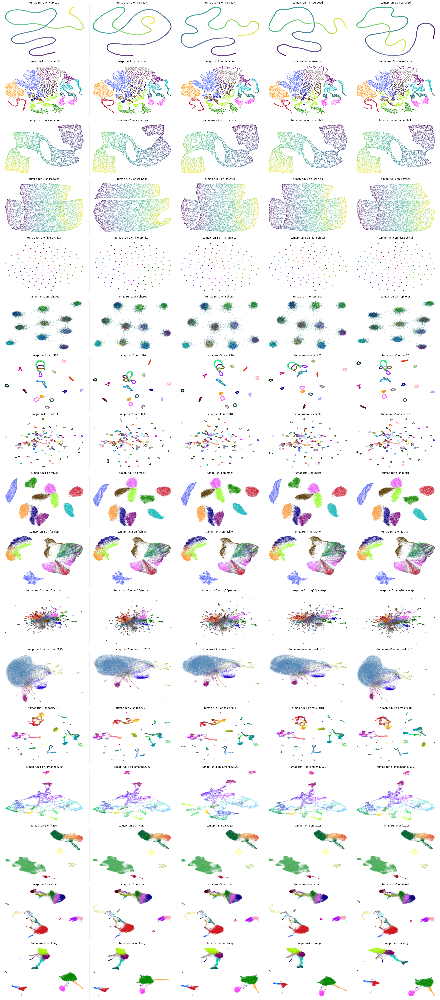

In [ ]:
experiment.plot()

It does seem possible that results are slightly more stable by initializing with PCA versus
spectral methods. Low-dimensional manifolds (`scurvehole` and `isoswiss`) are not better off, but
I've yet to see a convincing non-synthetic dataset where this mattered. On the other hand, `mnist`
shows a bit more variability.